# Model Construction

In [57]:
import os 
import numpy as np
import pandas as pd
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader, TensorDataset
import glob
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import random

In [58]:
seed_value = 42
os.environ['PYTHONHASHSEED'] = str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
torch.manual_seed(seed_value)
torch.cuda.manual_seed(seed_value)
torch.cuda.manual_seed_all(seed_value)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

## Mamba 

In [59]:
!pip install mamba-ssm==2.2.4 --no-build-isolation

In [60]:
from mamba_ssm import Mamba
import torch
import torch.nn as nn

class MambaModule(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.mb = Mamba(d_model=input_dim, d_state=16, d_conv=4, expand=2)
        self.norm = nn.LayerNorm(input_dim)

    def forward(self, x):
        out = self.mb(x)  
        return out

## FC Calculation

In [61]:
!pip install nilearn nibabel 

In [62]:
from nilearn.connectome import ConnectivityMeasure

def FC_compute(ts): 
    correlation_measure = ConnectivityMeasure(
        kind="correlation", 
        standardize="zscore_sample"
    )
    
    fc = correlation_measure.fit_transform([ts])[0]
    return fc

## Tokenization

In [63]:
class Tokenizer(nn.Module): 
    def __init__(self, input_dim, output_dim): 
        super().__init__()
        self.tokenizer = nn.Linear(input_dim, output_dim)
    def forward(self, x): 
        return self.tokenizer(x)

## Cross Attention 

### General Blocks 

In [64]:
class FeedForward(nn.Module):
    def __init__(self, dim, hidden_mult=4, dropout=0.1):
        super().__init__()
        self.ffw = nn.Sequential(
            nn.Linear(dim, hidden_mult*dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_mult*dim, dim),
            nn.Dropout(dropout),
        )
    def forward(self, x):
        return self.ffw(x)

In [65]:
class SelfAttention(nn.Module):
    def __init__(self, dim, heads=8, dropout=0.0, batch_first=True):
        super().__init__()
        self.norm1 = nn.LayerNorm(dim)
        self.attn  = nn.MultiheadAttention(dim, heads, dropout=dropout, batch_first=batch_first)
        self.drop1 = nn.Dropout(dropout)
        self.norm2 = nn.LayerNorm(dim)
        self.ffn   = FeedForward(dim, dropout=dropout)
        self.drop2 = nn.Dropout(dropout)

    def forward(self, x, attn_mask=None, key_padding_mask=None, need_weights=False):
        qkv_norm = self.norm1(x)
        ctx, attn_w = self.attn(
            query=qkv_norm, 
            key=qkv_norm, 
            value=qkv_norm, 
            attn_mask=attn_mask,
            key_padding_mask=key_padding_mask, need_weights=need_weights
        )
        x = x + self.drop1(ctx)
        x = x + self.drop2(self.ffn(self.norm2(x))) # residual connection 
        return (x, attn_w) if need_weights else x

In [66]:
class CrossAttention(nn.Module):
    def __init__(self, dim, heads=8, dropout=0.0, batch_first=True):
        super().__init__()
        self.norm_q = nn.LayerNorm(dim)
        self.norm_kv = nn.LayerNorm(dim)
        self.attn  = nn.MultiheadAttention(dim, heads, dropout=dropout, batch_first=batch_first)
        self.drop1 = nn.Dropout(dropout)
        self.norm2 = nn.LayerNorm(dim)
        self.ffn   = FeedForward(dim, dropout=dropout)
        self.drop2 = nn.Dropout(dropout)

    def forward(self, q, kv, attn_mask=None, key_padding_mask=None, need_weights=False):
        q_norm = self.norm_q(q)
        kv_norm = self.norm_kv(kv)
        ctx, attn_w = self.attn(
            query=q_norm, 
            key=kv_norm, 
            value=kv_norm, 
            attn_mask=attn_mask,      
            key_padding_mask=key_padding_mask, 
            need_weights=need_weights
        )
        x = q + self.drop1(ctx)
        x = x + self.drop2(self.ffn(self.norm2(x))) # residual connection 
        return (x, attn_w) if need_weights else x

In [67]:
class Classifier(nn.Module): 
    def __init__(self, input_dim, output_dim, dropout=0.0): 
        super().__init__()
        self.mlp = nn.Sequential(
            nn.Linear(input_dim, 4096),
            nn.ReLU(),
            nn.Dropout(dropout),

            nn.Linear(4096, 512),
            nn.ReLU(),
            nn.Dropout(dropout),
            
            nn.Linear(512, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            
            nn.Linear(64, output_dim)
        )
    def forward(self, x): 
        return self.mlp(x)
        

### Encoder-Decoder Blocks

In [68]:
class SCEncoder(nn.Module):
    def __init__(self, num_nodes, dim, layers=1, heads=8, dropout=0.1):
        super().__init__()
        self.input_proj = nn.Linear(num_nodes, dim) 
        self.blocks = nn.ModuleList([SelfAttention(dim, heads, dropout) for _ in range(layers)])
        self.out_norm = nn.LayerNorm(dim)

    def forward(self, sc):  
        x = self.input_proj(sc)  
        for blk in self.blocks:
            x = blk(x)
        return self.out_norm(x)  

In [69]:
class FCDecoder(nn.Module):
    def __init__(self, num_nodes, dim, layers=1, heads=8, dropout=0.1, 
                 predict_activation='tanh', mask_prob=0.1, seed=42):
        super().__init__()
        self.num_heads = heads
        self.input_proj = nn.Linear(num_nodes, dim)
        self.self_blocks = nn.ModuleList([SelfAttention(dim, heads, dropout) for _ in range(layers)])
        self.cross_blocks = nn.ModuleList([CrossAttention(dim, heads, dropout)])
        self.row_head = nn.Linear(dim, num_nodes)
        self.predict_activation = predict_activation
        self.mask_prob = mask_prob
        self.seed = seed

    def forward(self, fc, sc, target_fc=None):
        B, N, _ = fc.shape

        torch.manual_seed(self.seed)
        fc_mask = (torch.rand(B, N, N, device=fc.device) < self.mask_prob)
        diag_mask = torch.eye(N, device=fc.device, dtype=torch.bool).unsqueeze(0)
        fc_mask = fc_mask & (~diag_mask)  

        q = self.input_proj(fc)

        attn_mask_float = fc_mask.float() * -1e9
        attn_mask_float = attn_mask_float.repeat(self.num_heads, 1, 1)

        for blk in self.self_blocks:
            q = blk(q, attn_mask=attn_mask_float, need_weights=False)

        for blk in self.cross_blocks:
            q = blk(q, sc, need_weights=False)

        rows = self.row_head(q)
        if self.predict_activation == 'tanh':
            rows = torch.tanh(rows)

        # fc_pred = 0.5 * (rows + rows.transpose(1, 2))
        fc_pred = rows.masked_fill(diag_mask, 0.0)

        return fc_pred

# Training 

## Data

In [70]:
ts_path = "/kaggle/input/lemon-mri/ts/ts"
sc_path = "/kaggle/input/lemon-mri/SC/SC/prob"
fc_path = "/kaggle/input/lemon-mri/FC/FC"
metadata_path = "/kaggle/input/lemon-mri/participants.tsv"

In [71]:
df = pd.read_csv(metadata_path, sep="\t", nrows=212) 
df.columns = df.columns.str.strip()
remove_ids = ["sub-032457", "sub-032435", "sub-032509", "sub-032370"]
remove_rows = df[df['ID'].isin(remove_ids)].index
print(f"Remove row {remove_rows}")
df = df.drop(remove_rows)
print(df.columns)
print(len(df))

Remove row Index([67, 132, 152, 202], dtype='int64')
Index(['ID', 'Gender_ 1=female_2=male', 'Age'], dtype='object')
208


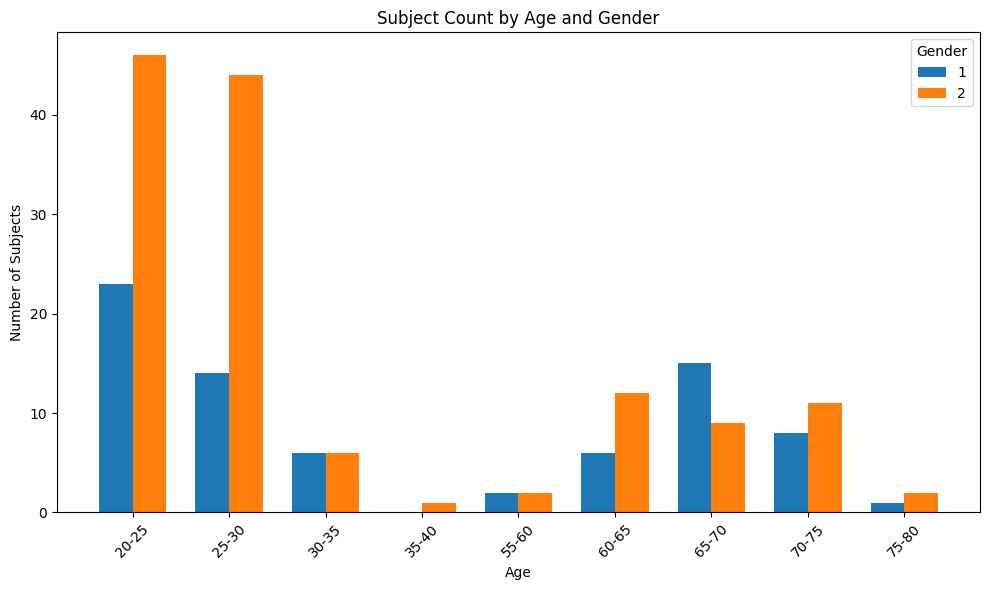

In [72]:
grouped = df.groupby(['Age', 'Gender_ 1=female_2=male']).size().unstack(fill_value=0)

ages = grouped.index
genders = grouped.columns
x = np.arange(len(ages))
bar_width = 0.35
fig, ax = plt.subplots(figsize=(10, 6))

for i, gender in enumerate(genders):
    ax.bar(x + i * bar_width, grouped[gender], width=bar_width, label=gender)

# Formatting
ax.set_xlabel('Age')
ax.set_ylabel('Number of Subjects')
ax.set_title('Subject Count by Age and Gender')
ax.set_xticks(x + bar_width / 2)
ax.set_xticklabels(ages, rotation=45)
ax.legend(title='Gender')
plt.tight_layout()
plt.show()

In [73]:
file_path = "/kaggle/input/lemon-mri/ts/ts/sub-032302_ts.txt"
data = np.loadtxt(file_path) 
data = data.transpose()
print(data.shape)

(246, 652)


In [74]:
def age_group_to_class(age_str):
    if age_str == "20-25" or age_str == "25-30" or age_str == "30-35" or age_str == "35-40":
        return 0
    elif age_str == "60-65" or age_str == "65-70" or age_str == "70-75" or age_str == "75-80" or age_str == "55-60":
        return 1
    raise ValueError(f"Unexpected age group: {age_str}")

id_to_label = {row["ID"]: age_group_to_class(row["Age"]) for _, row in df.iterrows()}
missing_ids = set()
y_data, ts_data, sc_data, fc_data = [], [], [], []

subj_ids = df["ID"].tolist()
print(subj_ids)

['sub-032301', 'sub-032302', 'sub-032303', 'sub-032304', 'sub-032305', 'sub-032306', 'sub-032307', 'sub-032308', 'sub-032309', 'sub-032310', 'sub-032311', 'sub-032312', 'sub-032313', 'sub-032314', 'sub-032315', 'sub-032316', 'sub-032317', 'sub-032318', 'sub-032319', 'sub-032320', 'sub-032321', 'sub-032322', 'sub-032323', 'sub-032324', 'sub-032325', 'sub-032326', 'sub-032327', 'sub-032328', 'sub-032329', 'sub-032330', 'sub-032331', 'sub-032332', 'sub-032333', 'sub-032334', 'sub-032335', 'sub-032336', 'sub-032337', 'sub-032338', 'sub-032340', 'sub-032342', 'sub-032343', 'sub-032344', 'sub-032345', 'sub-032346', 'sub-032347', 'sub-032348', 'sub-032349', 'sub-032350', 'sub-032351', 'sub-032352', 'sub-032353', 'sub-032354', 'sub-032355', 'sub-032356', 'sub-032357', 'sub-032358', 'sub-032359', 'sub-032360', 'sub-032361', 'sub-032362', 'sub-032363', 'sub-032364', 'sub-032365', 'sub-032366', 'sub-032367', 'sub-032368', 'sub-032369', 'sub-032371', 'sub-032372', 'sub-032373', 'sub-032374', 'sub-

In [75]:

import torch

for subj_id in subj_ids: 
    y_data.append(id_to_label[subj_id])
    
    # time series 
    ts_fname = f"{subj_id}_ts.txt"
    ts_fpath = os.path.join(ts_path, ts_fname)
    if os.path.isfile(ts_fpath):
        df = pd.read_csv(ts_fpath, sep='\s+', header=None)
        ts_data.append(torch.tensor(df.values, dtype=torch.float32))
    # SC
    sc_fname = f"{subj_id}_prob.csv"
    sc_fpath = os.path.join(sc_path, sc_fname)
    if os.path.isfile(sc_fpath):
        df = pd.read_csv(sc_fpath, header=None)
        df = df.apply(pd.to_numeric, errors='coerce').fillna(0)
        sc_tensor = torch.tensor(df.values, dtype=torch.float32)

        # Min-max normalization per subject
        sc_min = sc_tensor.min()
        sc_max = sc_tensor.max()
        if sc_max > sc_min:  
            sc_tensor = (sc_tensor - sc_min) / (sc_max - sc_min)
        else:
            sc_tensor = torch.zeros_like(sc_tensor)  # fallback if constant matrix
        
        sc_data.append(sc_tensor)

    # FC
    fc_fname = f"{subj_id}_FC.csv"
    fc_fpath = os.path.join(fc_path, fc_fname)
    if os.path.isfile(fc_fpath):
        df = pd.read_csv(fc_fpath, header=None)
        df = df.apply(pd.to_numeric, errors='coerce').fillna(0)
        fc_data.append(torch.tensor(df.values, dtype=torch.float32))
        
TS = torch.stack(ts_data)
SC = torch.stack(sc_data)
FC = torch.stack(fc_data)
y = torch.tensor(y_data, dtype=torch.long)
print(f"TS shape: {TS.shape}, SC shape: {SC.shape}, FC shape: {FC.shape}, y shape: {y.shape}")
print(f"Class distribution: {torch.bincount(y)}")

TS shape: torch.Size([208, 652, 246]), SC shape: torch.Size([208, 246, 246]), FC shape: torch.Size([208, 246, 246]), y shape: torch.Size([208])
Class distribution: tensor([140,  68])


In [76]:
class BrainAgesDataset(Dataset):
    def __init__(self, TS, SC, y):
        self.TS = TS
        self.SC = SC
        self.y = y

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.TS[idx], self.SC[idx], self.y[idx]

In [77]:
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.model_selection import train_test_split
import numpy as np
import torch

indices = np.arange(len(y))
trainval_idx, test_idx, y_trainval_np, y_test_np = train_test_split(
    indices, y.numpy(), test_size=0.15, stratify=y.numpy(), random_state=42
)

train_idx, val_idx, y_train_np, y_val_np = train_test_split(
    trainval_idx, y_trainval_np, test_size=0.1765, stratify=y_trainval_np, random_state=42
)

train_TS = TS[train_idx]
train_SC = SC[train_idx]
train_y = torch.tensor(y_train_np, dtype=torch.long)

val_TS = TS[val_idx]
val_SC = SC[val_idx]
val_y = torch.tensor(y_val_np, dtype=torch.long)

test_TS = TS[test_idx]
test_SC = SC[test_idx]
test_y = torch.tensor(y_test_np, dtype=torch.long)

X_train = BrainAgesDataset(train_TS, train_SC, train_y)
X_val   = BrainAgesDataset(val_TS, val_SC, val_y)
X_test  = BrainAgesDataset(test_TS, test_SC, test_y)

class_sample_count = torch.tensor([(train_y == t).sum() for t in torch.unique(train_y)], dtype=torch.float)
weights = 1. / class_sample_count
samples_weight = torch.tensor([weights[t] for t in train_y], dtype=torch.float)
sampler = WeightedRandomSampler(samples_weight, num_samples=len(samples_weight), replacement=True)

batch_size = 32
train_loader = DataLoader(X_train, batch_size=batch_size, sampler=sampler)
val_loader   = DataLoader(X_val, batch_size=batch_size, shuffle=False)
test_loader  = DataLoader(X_test, batch_size=batch_size, shuffle=False)

print(f"Train size: {len(train_y)}, Val size: {len(val_y)}, Test size: {len(test_y)}")
print("Train class distribution:", torch.bincount(train_y))
print("Val class distribution:", torch.bincount(val_y))
print("Test class distribution:", torch.bincount(test_y))

Train size: 144, Val size: 32, Test size: 32
Train class distribution: tensor([97, 47])
Val class distribution: tensor([21, 11])
Test class distribution: tensor([22, 10])


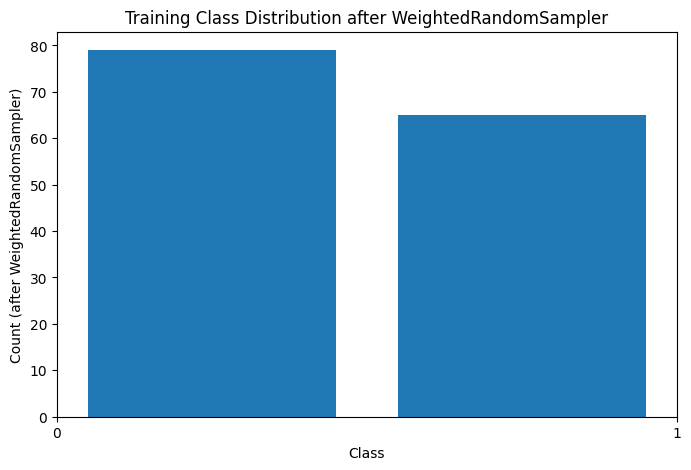

In [78]:
sampled_labels = []
for ts, sc, labels in train_loader:   # unpack all 3 items
    sampled_labels.extend(labels.tolist())

# Plot histogram of sampled labels
plt.figure(figsize=(8, 5))
plt.hist(sampled_labels, bins=len(torch.unique(train_y)), align='mid', rwidth=0.8)
plt.xticks(torch.unique(train_y).tolist())
plt.xlabel("Class")
plt.ylabel("Count (after WeightedRandomSampler)")
plt.title("Training Class Distribution after WeightedRandomSampler")
plt.show()

## Pretraining

In [79]:
embed_dim = 2048
num_epochs = 10 

In [80]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mamba = MambaModule(input_dim=246)
mamba.mb = mamba.mb.to(device)
mamba = mamba.to(device)
encoder = SCEncoder(num_nodes=246, dim=embed_dim).to(device)
decoder = FCDecoder(num_nodes=246, dim=embed_dim).to(device)

In [81]:
criterion = nn.MSELoss()   
optimizer = torch.optim.Adam(
    list(mamba.parameters()) +
    list(encoder.parameters()) +
    list(decoder.parameters()), lr=1e-4
)

train_losses = []
val_losses = []

for epoch in range(num_epochs):
    mamba.train()
    encoder.train()
    decoder.train()
    
    train_epoch_loss = 0.0
    
    for TS_batch, SC_batch, _ in train_loader:
        TS_batch, SC_batch = TS_batch.to(device), SC_batch.to(device)
        
        optimizer.zero_grad()
        
        ts_repr = mamba(TS_batch)  
        SC_batch = encoder(SC_batch)
        FC_batch_list = [FC_compute(ts.detach().cpu().numpy()) for ts in ts_repr]
        FC_batch = torch.tensor(FC_batch_list, dtype=torch.float32, device=device)
        
        sc_fc_fusion = decoder(FC_batch, SC_batch)
        
        
        loss = criterion(sc_fc_fusion, FC_batch)
        loss.backward()
        optimizer.step()
        
        train_epoch_loss += loss.item()
    
    mamba.eval()
    encoder.eval()
    decoder.eval()
    
    val_epoch_loss = 0.0
    
    with torch.no_grad():
        for TS_batch, SC_batch, _ in val_loader:
            TS_batch, SC_batch = TS_batch.to(device), SC_batch.to(device)
            
            ts_repr = mamba(TS_batch)
            SC_batch = encoder(SC_batch)
            FC_batch_list = [FC_compute(ts.detach().cpu().numpy()) for ts in ts_repr]
            FC_batch = torch.tensor(FC_batch_list, dtype=torch.float32, device=device)
            
            sc_fc_fusion = decoder(FC_batch, SC_batch)
            
            loss = criterion(sc_fc_fusion, FC_batch)
            val_epoch_loss += loss.item()
    
    train_losses.append(train_epoch_loss / len(train_loader))
    val_losses.append(val_epoch_loss / len(val_loader))
    
    print(f"Epoch {epoch+1}/{num_epochs} | "
          f"Train Loss: {train_losses[-1]:.4f} | Val Loss: {val_losses[-1]:.4f}")

Epoch 1/10 | Train Loss: 0.2310 | Val Loss: 0.1214
Epoch 2/10 | Train Loss: 0.0951 | Val Loss: 0.0574
Epoch 3/10 | Train Loss: 0.0566 | Val Loss: 0.0392
Epoch 4/10 | Train Loss: 0.0407 | Val Loss: 0.0288
Epoch 5/10 | Train Loss: 0.0313 | Val Loss: 0.0228
Epoch 6/10 | Train Loss: 0.0253 | Val Loss: 0.0197
Epoch 7/10 | Train Loss: 0.0214 | Val Loss: 0.0173
Epoch 8/10 | Train Loss: 0.0191 | Val Loss: 0.0154
Epoch 9/10 | Train Loss: 0.0171 | Val Loss: 0.0145
Epoch 10/10 | Train Loss: 0.0158 | Val Loss: 0.0135


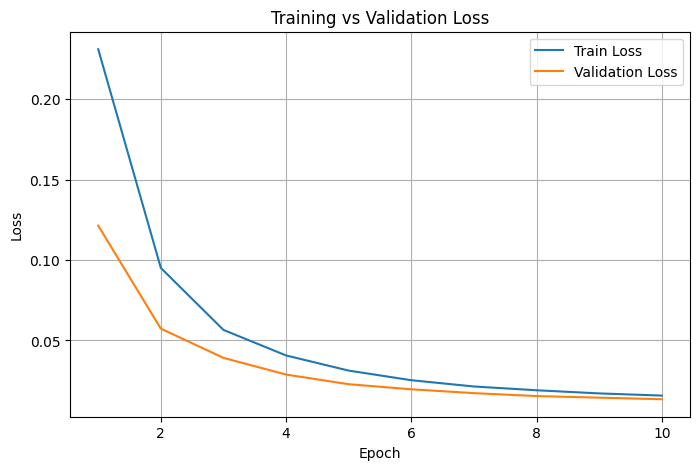

In [82]:
plt.figure(figsize=(8,5))
plt.plot(range(1, num_epochs+1), train_losses, label="Train Loss")
plt.plot(range(1, num_epochs+1), val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

In [83]:
mamba.eval()
encoder.eval()
all_fc_train = []
all_sc_train = []
with torch.no_grad():
    for TS_batch, SC_batch, _ in train_loader:
        sc_repr = encoder(SC_batch.to(device))
        all_sc_train.append(sc_repr.cpu())  
        ts_repr = mamba(TS_batch.to(device))
        for ts in ts_repr: 
            ts_np = ts.cpu().numpy()
            fc = FC_compute(ts_np)  
            all_fc_train.append(torch.tensor(fc))
SC_train_embeddings = torch.cat(all_sc_train, dim=0)
FC_train_embeddings = torch.stack(all_fc_train, dim=0)

all_fc_val = []
all_sc_val = [] 
with torch.no_grad():
    for TS_batch, SC_batch, _ in val_loader:
        sc_repr = encoder(SC_batch.to(device))
        all_sc_val.append(sc_repr.cpu())  
        ts_repr = mamba(TS_batch.to(device))
        for ts in ts_repr:
            ts_np = ts.cpu().numpy()
            fc = FC_compute(ts_np)
            all_fc_val.append(torch.tensor(fc))
FC_val_embeddings = torch.stack(all_fc_val, dim=0)
SC_val_embeddings = torch.cat(all_sc_val, dim=0)

## Classification

In [84]:
class FCEncoder_Finetune(nn.Module):
    def __init__(self, num_nodes, dim, layers=2, heads=8, dropout=0.1):
        super().__init__()
        self.input_proj = nn.Linear(num_nodes, dim)
        self.self_blocks  = nn.ModuleList([SelfAttention(dim, heads, dropout) for _ in range(layers)])
        self.cross_blocks = nn.ModuleList([CrossAttention(dim, heads, dropout)])
        self.row_head = nn.Linear(dim, 246)
        self.layer_norm = nn.LayerNorm(246)

    def forward(self, fc, sc):
        x = self.input_proj(fc)
        for blk in self.self_blocks:
            x = blk(x)
        for blk in self.cross_blocks:
            x = blk(x, sc)
        
        rows = self.row_head(x)
        # rows = 0.5 * (rows + rows.transpose(1, 2)) 
        
        fc_out = fc + rows  
        fc_out = self.layer_norm(fc_out)  
        return fc_out

In [85]:
class FC_SC_Classifier(nn.Module):
    def __init__(self, num_nodes, dim, hidden_dim=3072, proj_dim=1024, output_dim=2, layers=2, heads=8, dropout=0.1):
        super().__init__()
        self.fc_encoder = FCEncoder_Finetune(num_nodes, dim, layers, heads, dropout)
        self.flat_dim = (num_nodes * (num_nodes - 1)) // 2
        
        self.dim_reduce = nn.Sequential(
            nn.Linear(self.flat_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, proj_dim),  
            nn.ReLU(),
            nn.Dropout(dropout)
        )
        self.classifier = Classifier(input_dim=proj_dim, output_dim=output_dim, dropout=dropout)

    def forward(self, fc, sc):
        x = self.fc_encoder(fc, sc)  
        B, N, _ = x.shape
        x = torch.matmul(x, x.transpose(-1, -2))  

        uptri = torch.triu_indices(N, N, offset=1, device=x.device)
        x = x[:, uptri[0], uptri[1]]   
        x = self.dim_reduce(x)   
        out = self.classifier(x)
        return out

In [86]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction='mean'):
        """
        alpha: Tensor or list of shape [num_classes] to weight classes (like class_weights)
        gamma: focusing parameter (>0) to down-weight easy examples
        reduction: 'none' | 'mean' | 'sum'
        """
        super(FocalLoss, self).__init__()
        if alpha is not None:
            if isinstance(alpha, (list, torch.Tensor)):
                self.alpha = torch.tensor(alpha, dtype=torch.float32)
            else:
                raise TypeError("alpha must be list or torch.Tensor")
        else:
            self.alpha = None
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        """
        inputs: [batch_size, num_classes] (logits, not softmaxed)
        targets: [batch_size] (ground-truth class indices)
        """
        # Convert logits to probabilities
        log_probs = F.log_softmax(inputs, dim=-1)
        probs = torch.exp(log_probs)

        # Gather the probabilities corresponding to the true class
        targets = targets.view(-1, 1)
        pt = probs.gather(1, targets).squeeze(1)
        log_pt = log_probs.gather(1, targets).squeeze(1)

        # Apply alpha balancing
        if self.alpha is not None:
            alpha_t = self.alpha.to(inputs.device).gather(0, targets.squeeze())
        else:
            alpha_t = 1.0

        # Compute focal loss
        focal_term = (1 - pt) ** self.gamma
        loss = -alpha_t * focal_term * log_pt

        # Reduction
        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        else:
            return loss


In [87]:
import torch
import torch.nn as nn
import numpy as np
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import recall_score, f1_score

# ========================
# Setup
# ========================
device = "cuda" if torch.cuda.is_available() else "cpu"

# --- Compute class weights ---
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_y.cpu().numpy()),
    y=train_y.cpu().numpy()
)
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
print("Class weights:", class_weights)

# --- Model & optimizer ---
model = FC_SC_Classifier(num_nodes=246, dim=2048, output_dim=2).to(device)
# criterion = nn.CrossEntropyLoss(weight=class_weights)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)

num_epochs = 30
batch_size = 32
patience = 5   # stop if no improvement for N epochs
best_val_loss = float("inf")
patience_counter = 0

train_losses, val_losses = [], []

# ========================
# Training loop
# ========================
for epoch in range(num_epochs):
    # --- Training ---
    model.train()
    epoch_loss = 0.0

    for i in range(0, FC_train_embeddings.size(0), batch_size):
        fc_batch = FC_train_embeddings[i:i+batch_size].to(device)
        sc_batch = SC_train_embeddings[i:i+batch_size].to(device)
        labels_batch = train_y[i:i+batch_size].long().to(device)

        optimizer.zero_grad()
        outputs = model(fc_batch, sc_batch)
        loss = criterion(outputs, labels_batch)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item() * fc_batch.size(0)

    avg_train_loss = epoch_loss / FC_train_embeddings.size(0)
    train_losses.append(avg_train_loss)

    # --- Validation ---
    model.eval()
    val_loss = 0.0
    correct, total = 0, 0
    all_preds, all_true = [], []

    with torch.no_grad():
        for i in range(0, FC_val_embeddings.size(0), batch_size):
            fc_batch = FC_val_embeddings[i:i+batch_size].to(device)
            sc_batch = SC_val_embeddings[i:i+batch_size].to(device)
            labels_batch = val_y[i:i+batch_size].long().to(device)

            outputs = model(fc_batch, sc_batch)
            loss = criterion(outputs, labels_batch)
            val_loss += loss.item() * fc_batch.size(0)

            preds = outputs.argmax(dim=1)
            correct += (preds == labels_batch).sum().item()
            total += labels_batch.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_true.extend(labels_batch.cpu().numpy())

    avg_val_loss = val_loss / FC_val_embeddings.size(0)
    val_losses.append(avg_val_loss)
    val_acc = correct / total

    # Extra metrics
    val_recall = recall_score(all_true, all_preds, average="binary", pos_label=1)
    val_f1 = f1_score(all_true, all_preds, average="binary", pos_label=1)

    print(f"Epoch {epoch+1}/{num_epochs} | "
          f"Train Loss: {avg_train_loss:.4f} | "
          f"Val Loss: {avg_val_loss:.4f} | "
          f"Val Acc: {val_acc:.4f} | "
          f"Recall (minority): {val_recall:.4f} | "
          f"F1 (minority): {val_f1:.4f}")

    # --- Early Stopping ---
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        patience_counter = 0
        best_model_state = model.state_dict()  # save best model
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

# Load best model
model.load_state_dict(best_model_state)

Class weights: tensor([0.7423, 1.5319], device='cuda:0')
Epoch 1/30 | Train Loss: 5.5108 | Val Loss: 0.7302 | Val Acc: 0.5312 | Recall (minority): 0.1818 | F1 (minority): 0.2105
Epoch 2/30 | Train Loss: 1.9058 | Val Loss: 0.8206 | Val Acc: 0.4375 | Recall (minority): 0.3636 | F1 (minority): 0.3077
Epoch 3/30 | Train Loss: 1.4572 | Val Loss: 0.7511 | Val Acc: 0.3750 | Recall (minority): 0.8182 | F1 (minority): 0.4737
Epoch 4/30 | Train Loss: 0.8492 | Val Loss: 0.7377 | Val Acc: 0.3750 | Recall (minority): 0.4545 | F1 (minority): 0.3333
Epoch 5/30 | Train Loss: 0.7366 | Val Loss: 0.7213 | Val Acc: 0.6562 | Recall (minority): 0.0000 | F1 (minority): 0.0000
Epoch 6/30 | Train Loss: 0.8073 | Val Loss: 0.6939 | Val Acc: 0.5938 | Recall (minority): 0.0909 | F1 (minority): 0.1333
Epoch 7/30 | Train Loss: 0.6668 | Val Loss: 0.6655 | Val Acc: 0.6250 | Recall (minority): 0.0000 | F1 (minority): 0.0000
Epoch 8/30 | Train Loss: 0.6581 | Val Loss: 0.7081 | Val Acc: 0.6562 | Recall (minority): 0.0909

<All keys matched successfully>

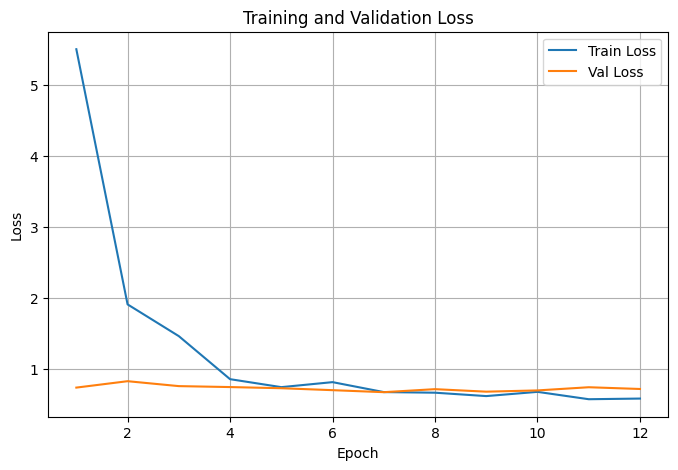

In [88]:
epochs_ran = len(train_losses)

plt.figure(figsize=(8,5))
plt.plot(range(1, epochs_ran+1), train_losses, label="Train Loss")
plt.plot(range(1, epochs_ran+1), val_losses, label="Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

## Testing

In [89]:
mamba.eval()
encoder.eval()
all_fc_test = []
all_sc_test = []
with torch.no_grad():
    for TS_batch, SC_batch, _ in test_loader:
        sc_repr = encoder(SC_batch.to(device))
        all_sc_test.append(sc_repr.cpu())  
        ts_repr = mamba(TS_batch.to(device))
        for ts in ts_repr: 
            ts_np = ts.cpu().numpy()
            fc = FC_compute(ts_np)  
            all_fc_test.append(torch.tensor(fc))
SC_test_embeddings = torch.cat(all_sc_test, dim=0)
FC_test_embeddings = torch.stack(all_fc_test, dim=0)

In [90]:
from sklearn.metrics import confusion_matrix, classification_report

device = "cuda" if torch.cuda.is_available() else "cpu"
model.eval()  

all_preds = []
all_true = []

with torch.no_grad():
    for i in range(0, FC_test_embeddings.size(0), batch_size):
        fc_batch = FC_test_embeddings[i:i+batch_size].to(device)
        sc_batch = SC_test_embeddings[i:i+batch_size].to(device)
        labels_batch = test_y[i:i+batch_size].long().to(device)  # make sure labels are long

        outputs = model(fc_batch, sc_batch)
        preds = outputs.argmax(dim=1)

        all_preds.append(preds.cpu())
        all_true.append(labels_batch.cpu())

all_preds = torch.cat(all_preds)
all_true = torch.cat(all_true)

test_acc = (all_preds == all_true).sum().item() / all_true.size(0)
print(f"Test Accuracy: {test_acc:.4f}")

cm = confusion_matrix(all_true.numpy(), all_preds.numpy())
print("Confusion Matrix:")
print(cm)

report = classification_report(all_true.numpy(), all_preds.numpy())
print("Classification Report:")
print(report)

Test Accuracy: 0.6250
Confusion Matrix:
[[19  3]
 [ 9  1]]
Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.86      0.76        22
           1       0.25      0.10      0.14        10

    accuracy                           0.62        32
   macro avg       0.46      0.48      0.45        32
weighted avg       0.54      0.62      0.57        32



# Mamba Interpret

In [94]:
# ===========================================================
# Imports and Type Aliases
# (Assumed to be the same as your original script)
# Make sure to `pip install tqdm` if you don't have it.
# ===========================================================
from __future__ import annotations
from contextlib import contextmanager
from typing import Any, Dict, Iterable, List, Literal, Optional, Sequence, Tuple

import numpy as np
import torch
import torch.nn.functional as F
import matplotlib as mpl
import matplotlib.pyplot as plt
import nibabel as nib
from nilearn import plotting
from scipy.ndimage import center_of_mass
from nibabel.affines import apply_affine
from tqdm.auto import tqdm # For progress bars

# -------------------------
# Type aliases
# -------------------------
RowMode = Literal["source", "dest"]

# ===========================================================
# Core Mamba Interaction & Math (Optimized)
# ===========================================================

# _capture_ABCDtC_all_timesteps and _force_slow_path are unchanged
# as they are necessary for data extraction.

@contextmanager
def _force_slow_path(mamba_layer: torch.nn.Module):
    """Temporarily disable the fast path so forward hooks fire."""
    old = getattr(mamba_layer, "use_fast_path", False)
    setattr(mamba_layer, "use_fast_path", False)
    try:
        yield
    finally:
        setattr(mamba_layer, "use_fast_path", old)

@torch.no_grad()
def _capture_ABCDtC_all_timesteps(layer: torch.nn.Module, x_in: torch.Tensor) -> Dict[str, torch.Tensor]:
    """Extract internal 'taps' from a Mamba-like layer for a *single* forward pass."""
    if x_in.ndim != 3:
        raise ValueError(f"x_in must be [B, L, D], got {tuple(x_in.shape)}")

    B, L, D = x_in.shape
    taps: Dict[str, torch.Tensor] = {}

    def hook_xproj(mod, inp, out):
        dt_rank, d_state = layer.dt_rank, layer.d_state
        dt_raw, B_flat, C_flat = torch.split(out, [dt_rank, d_state, d_state], dim=-1)
        dt_pre = (layer.dt_proj.weight @ dt_raw.t()).t().view(B, L, -1).permute(0, 2, 1).contiguous()
        B_all  = B_flat.view(B, L, d_state).permute(0, 2, 1).contiguous()
        C_all  = C_flat.view(B, L, d_state).permute(0, 2, 1).contiguous()
        taps.update({"dt_pre": dt_pre.detach(), "B_all": B_all.detach(), "C_all": C_all.detach()})

    h = layer.x_proj.register_forward_hook(hook_xproj)
    try:
        with _force_slow_path(layer):
            _ = layer(x_in.to(next(layer.parameters()).dtype))
    finally:
        h.remove()

    taps["A"]       = (-torch.exp(layer.A_log.float())).detach()
    taps["dt_bias"] = layer.dt_proj.bias.detach()
    taps["W_out"]   = layer.out_proj.weight.detach()
    taps["W_in_x"]  = layer.in_proj.weight.detach()[:layer.d_inner, :]
    return taps


@torch.no_grad()
def lag1_roi_matrix_sequence(
    model: torch.nn.Module,
    xb: torch.Tensor,
    include_gate: bool = True,
    rows: RowMode = "source",
) -> torch.Tensor:
    """
    # OPTIMIZED: Vectorized computation of M_t for all lag-1 steps t=1..L-1.
    # Returns a single tensor of shape [D, D, L-1].
    """
    layer = model.mb
    taps = _capture_ABCDtC_all_timesteps(layer, xb)
    A, dt_pre, B_all, C_all = taps["A"], taps["dt_pre"], taps["B_all"], taps["C_all"]
    dt_bias, W_out, W_in_x  = taps["dt_bias"], taps["W_out"], taps["W_in_x"]

    B, L, D = xb.shape
    d_inner, d_state = A.shape

    # Discretization and prefix scan (same as before)
    dt = F.softplus(dt_pre + dt_bias.view(1, -1, 1))           # [B, d_inner, L]
    log_dA = dt.unsqueeze(2) * A.view(1, d_inner, d_state, 1)  # [B, d_inner, d_state, L]
    S = torch.cumsum(log_dA, dim=-1)

    # Slice tensors for all timesteps t=1..L-1 at once
    s_t = S[..., 1:]      # S at time t
    s_j = S[..., :-1]     # S at time t-1
    dt_j = dt[..., :-1]   # Δt at time t-1
    B_j = B_all[..., :-1] # B at time t-1
    C_t = C_all[..., 1:]  # C at time t

    # Compute alpha (influence term) for all timesteps in parallel
    logprod = s_t - s_j                                            # [B, d_inner, d_state, L-1]
    dB_j = dt_j.unsqueeze(2) * B_j.unsqueeze(1)                    # [B, d_inner, d_state, L-1]
    
    # Einsum is efficient for this specific batched dot product over d_state
    # alpha_t = sum_{n=1..d_state} ( exp(s_t - s_j)_n * dB_j_n * C_t_n )
    alpha = torch.einsum(
        "bist,bist,bst->bit",
        torch.exp(logprod),
        dB_j,
        C_t,                      # keep [B, d_state, L-1]
    )[0]                          # drop batch at the end -> [d_inner, L-1]

    # Apply SILU gate if requested
    if include_gate:
        xz = layer.in_proj(xb.to(W_in_x.dtype))
        _, z = torch.chunk(xz, 2, dim=-1)
        gate = F.silu(z).permute(0, 2, 1).contiguous()[0] # [d_inner, L]
        alpha = alpha * gate[:, 1:] # Apply gate at time t

    # Compute all M_t matrices at once
    # M_t = W_out @ diag(alpha_t) @ W_in_x
    M_sequence = torch.einsum("qd,dt,dr->qrt", W_out, alpha, W_in_x)

    if rows == "source":
        M_sequence = M_sequence.permute(1, 0, 2) # [D, D, L-1] (rows=r, cols=q)
        
    return M_sequence

# ===========================================================
# Brainnetome centroids
# ===========================================================

def bna_centroids(labels_img_path: str, label_ids: Optional[Sequence[int]] = None) -> Tuple[np.ndarray, np.ndarray]:
    """
    Compute centroid coordinates (MNI) for Brainnetome atlas labels.

    Args:
        labels_img_path: path to BN_Atlas_246_2mm.nii (0 = background)
        label_ids: optional subset of label IDs to include; default 1..246

    Returns:
        (label_ids_array, coords) where coords is [D,3] (np.nan if missing)
    """
    img = nib.load(labels_img_path)
    data, aff = img.get_fdata(), img.affine
    if label_ids is None:
        label_ids = sorted(int(x) for x in np.unique(data) if x > 0)

    coords = np.zeros((len(label_ids), 3), dtype=float)
    for i, lab in enumerate(label_ids):
        mask = (data == lab)
        coords[i] = apply_affine(aff, center_of_mass(mask.astype(np.float32))) if mask.any() else np.nan
    return np.asarray(label_ids, dtype=int), coords

# ===========================================================
# Visualization (Optimized)
# ===========================================================

def filter_matrix_top_fraction(M: torch.Tensor, frac: float) -> torch.Tensor:
    """
    # NEW: Efficiently keep only the top fraction of connections by absolute weight.
    Returns a sparse matrix with other elements zeroed out.
    """
    if frac >= 1.0:
        return M
    if frac <= 0.0:
        return torch.zeros_like(M)

    M_abs = M.abs()
    # Find the threshold value for the top fraction
    k = max(1, int(M.numel() * frac))
    # We need the k-th largest value, which is (numel - k)-th smallest
    threshold = torch.kthvalue(M_abs.flatten(), M.numel() - k).values
    
    # Create a mask and apply it
    mask = M_abs >= threshold
    return M * mask


def plot_connectome_from_matrix_gradient(
    adj_matrix: np.ndarray,
    coords: np.ndarray,
    title: str = "Lag-1 influence",
    cmap: str = "coolwarm",
    figsize: Tuple[int, int] = (16, 8),
    dpi: int = 180,
    hide_isolated: bool = True,
    node_size_base: float = 10,
    node_size_range: float = 90,
    node_color: str = "gray",
):
    """
    # REFACTORED: Plots connectome directly from an adjacency matrix.
    """
    D = coords.shape[0]
    if adj_matrix.shape != (D, D):
        raise ValueError(f"Matrix shape {adj_matrix.shape} must match coords count {D}.")

    # Symmetrize the matrix for nilearn's undirected graph plotting
    A_sym = (adj_matrix + adj_matrix.T) / 2.0
    
    kept_idx = np.arange(D)
    if hide_isolated:
        active = (A_sym != 0).any(axis=0)
        if not active.any():
            print(f"Skipping plot for '{title}': No connections survived thresholding.")
            return
        kept_idx = np.flatnonzero(active)
        A_sym = A_sym[np.ix_(kept_idx, kept_idx)]
        coords_plot = coords[kept_idx]
    else:
        coords_plot = coords

    # Node sizes by incident magnitude (strength)
    strength = np.abs(A_sym).sum(axis=1)
    s_max = strength.max()
    node_size = node_size_base + node_size_range * (strength / (s_max + 1e-9))

    vmax = np.nanmax(np.abs(A_sym)) if A_sym.size > 0 else 1.0
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    
    plotting.plot_connectome(
        adjacency_matrix=A_sym,
        node_coords=coords_plot,
        node_size=node_size.tolist(),
        node_color=[node_color] * coords_plot.shape[0],
        edge_cmap=cmap,
        edge_vmin=-vmax,
        edge_vmax=vmax,
        title=title,
        axes=ax,
    )

    norm = mpl.colors.TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    fig.colorbar(sm, ax=ax, fraction=0.046, pad=0.04, label="Edge Strength (Symmetrized)")
    plt.show()

In [95]:
# ===========================================================
# Main Workflow (Optimized)
# ===========================================================

def _find_xb_in_batch(batch):
    # Return xb ([B,L,D]) and the container holding everything to search pid in.
    if isinstance(batch, dict):
        # find a 3D tensor as xb
        for k, v in batch.items():
            if isinstance(v, torch.Tensor) and v.ndim == 3:
                return v, batch
        # fallback: any 3D tensor value
        for v in batch.values():
            if isinstance(v, torch.Tensor) and v.ndim == 3:
                return v, batch
        raise ValueError("Could not find xb [B,L,D] in dict batch.")
    elif isinstance(batch, (list, tuple)):
        for item in batch:
            if isinstance(item, torch.Tensor) and item.ndim == 3:
                return item, batch
        # fallback: first tensor
        for item in batch:
            if isinstance(item, torch.Tensor):
                return item, batch
        raise ValueError("Could not find xb [B,L,D] in tuple/list batch.")
    elif isinstance(batch, torch.Tensor):
        return batch, None
    else:
        raise ValueError(f"Unsupported batch type: {type(batch)}")


def _normalize_pid_container(pid_candidate, B: int):
    """
    Turn various pid shapes into a 1D list of python ints length B.
    Accepts:
      - Tensor [B] -> ok
      - Tensor [B,1] -> squeeze
      - One-hot Tensor [B,C] (sum ~1 along C) -> argmax
      - list/tuple length B of ints/strings -> coerce to ints when possible
    Returns: list[int] or None if not found/invalid.
    """
    if pid_candidate is None:
        return None

    # Tensor cases
    if isinstance(pid_candidate, torch.Tensor):
        t = pid_candidate
        if t.ndim == 1 and t.numel() == B:
            return [int(x) for x in t.detach().cpu().tolist()]
        if t.ndim == 2 and t.shape[0] == B:
            # [B,1] -> squeeze
            if t.shape[1] == 1:
                return [int(x) for x in t.squeeze(1).detach().cpu().tolist()]
            # maybe one-hot [B,C]
            # heuristic: if each row sums to ~1 and values in [0,1], take argmax
            row_sums = t.detach().float().sum(dim=1)
            if torch.all((row_sums > 0.99) & (row_sums < 1.01)):
                idx = t.detach().float().argmax(dim=1)
                return [int(x) for x in idx.cpu().tolist()]
            # else: cannot interpret safely
            raise ValueError(f"pid tensor has shape {tuple(t.shape)} not interpretable as IDs.")
        # Anything else -> reject
        raise ValueError(f"pid tensor has shape {tuple(t.shape)}; expected [B] or [B,1] or one-hot [B,C].")

    # Python list/tuple
    if isinstance(pid_candidate, (list, tuple)) and len(pid_candidate) == B:
        out = []
        for v in pid_candidate:
            try:
                out.append(int(v))
            except Exception:
                # keep as string if truly non-numeric
                out.append(str(v))
        return out

    # Dict case: try common keys
    if isinstance(pid_candidate, dict):
        for k in ("pid", "id", "subject_id", "label"):
            if k in pid_candidate:
                return _normalize_pid_container(pid_candidate[k], B)
        raise ValueError("pid dict found but no recognizable key among ('pid','id','subject_id','label').")

    # Anything else -> not valid
    return None


def _extract_xb_pid_from_batch(batch):
    """
    Robust extractor: returns (xb, pid_list or None).
    Ensures pid_list is length-B python ints when possible.
    """
    xb, container = _find_xb_in_batch(batch)
    B = xb.shape[0]

    # 1) dict batches
    if isinstance(batch, dict):
        # try common keys first
        for key in ("pid", "id", "subject_id", "labels", "y", "group", "targets"):
            if key in batch:
                pid_list = _normalize_pid_container(batch[key], B)
                if pid_list is not None:
                    return xb, pid_list
        # otherwise search any 1D tensor/list length B
        for v in batch.values():
            try:
                pid_list = _normalize_pid_container(v, B)
                if pid_list is not None:
                    return xb, pid_list
            except Exception:
                pass
        return xb, None

    # 2) tuple/list batches
    if isinstance(batch, (list, tuple)):
        # search all non-xb items for a valid pid container
        for item in batch:
            if item is xb:
                continue
            try:
                pid_list = _normalize_pid_container(item, B)
                if pid_list is not None:
                    return xb, pid_list
            except Exception:
                continue
        return xb, None

    # 3) raw tensor batch (no pid available)
    return xb, None

def _pid_at_index(pid_list, idx: int):
    if pid_list is None:
        return None
    return pid_list[idx]


def group_sequence_average(
    model: torch.nn.Module,
    dataloader: Iterable,
    group_assign: Dict[Any, int],
    device: torch.device,
    max_steps: int = 20,
    rows: RowMode = "source",
    include_gate: bool = True,
) -> Dict[int, torch.Tensor]:
    """
    # OPTIMIZED: Computes group average lag-1 matrices for each timestep.
    # Now returns a dictionary mapping group ID to a single [D, D, T] tensor.
    """
    dtype = model.mb.out_proj.weight.dtype
    sums: Dict[int, torch.Tensor] = {}
    counts: Dict[int, torch.Tensor] = {}
    
    unique_groups = sorted(list(set(group_assign.values())))
    for g in unique_groups:
        # Initialize sums and counts as tensors on CPU
        # We assume the model produces a fixed number of ROIs (D)
        # To get D, we can instantiate one sequence
        try:
            temp_xb, _ = _extract_xb_pid_from_batch(next(iter(dataloader)))
            D = temp_xb.shape[-1]
        except StopIteration:
            print("Dataloader is empty, cannot determine ROI count.")
            return {}
        
        sums[g] = torch.zeros(D, D, max_steps, dtype=torch.float32)
        counts[g] = torch.zeros(max_steps, dtype=torch.int32)

    print(f"Averaging sequences for groups {unique_groups} up to {max_steps} timesteps...")
    for batch in tqdm(dataloader, desc="Processing Batches"):
        xb, pids = _extract_xb_pid_from_batch(batch)
        xb = xb.to(device)
        B, L, _ = xb.shape

        for b_idx in range(B):
            pid = _pid_at_index(pids, b_idx)
            if pid is None or pid not in group_assign:
                continue

            g = group_assign[pid]
            
            # This is the optimized, vectorized call
            M_seq = lag1_roi_matrix_sequence(
                model, xb[b_idx:b_idx+1].to(dtype), include_gate=include_gate, rows=rows
            )
            
            # Add to the running total
            T = min(max_steps, M_seq.shape[2])
            sums[g][:, :, :T] += M_seq[:, :, :T].detach().cpu()
            counts[g][:T] += 1
            
    # Compute the final averages
    group_avg: Dict[int, torch.Tensor] = {}
    for g in unique_groups:
        # Avoid division by zero by creating a safe denominator
        safe_counts = counts[g].clone().float()
        safe_counts[safe_counts == 0] = 1.0
        group_avg[g] = sums[g] / safe_counts.view(1, 1, -1)
        
    return group_avg


def visualize_group_connectome_timesteps(
    group_avg: Dict[int, torch.Tensor],
    group_id: int,
    coords: np.ndarray,
    *,
    timesteps: Sequence[int],
    global_frac: float = 1/8,
    hide_isolated: bool = True,
    node_color: str = "gray",
    dpi: int = 180,
    title_prefix: str = "Lag-1 connectome (group {g}) — step {t}",
):
    """
    # OPTIMIZED: Renders connectomes for specified timesteps using direct matrix plotting.
    """
    if group_id not in group_avg:
        print(f"Group {group_id} not found in average results. Available: {list(group_avg.keys())}")
        return

    M_sequence = group_avg[group_id] # Shape [D, D, T]
    
    for t_idx in timesteps:
        # t_idx is 1-based for humans, so convert to 0-based index
        if not (1 <= t_idx <= M_sequence.shape[2]):
            print(f"Skipping timestep {t_idx}: out of range (1 to {M_sequence.shape[2]}).")
            continue

        M_t = M_sequence[:, :, t_idx - 1]
        
        # Filter the matrix directly
        M_filtered = filter_matrix_top_fraction(M_t, frac=global_frac)
        
        # Plot from the filtered matrix
        plot_connectome_from_matrix_gradient(
            adj_matrix=M_filtered.numpy(),
            coords=coords,
            title=title_prefix.format(g=group_id, t=t_idx),
            hide_isolated=hide_isolated,
            node_color=node_color,
            dpi=dpi,
        )

Averaging sequences for groups [0, 1] up to 20 timesteps...


Processing Batches:   0%|          | 0/5 [00:00<?, ?it/s]


--- Visualizing connectomes for Group 0 ---


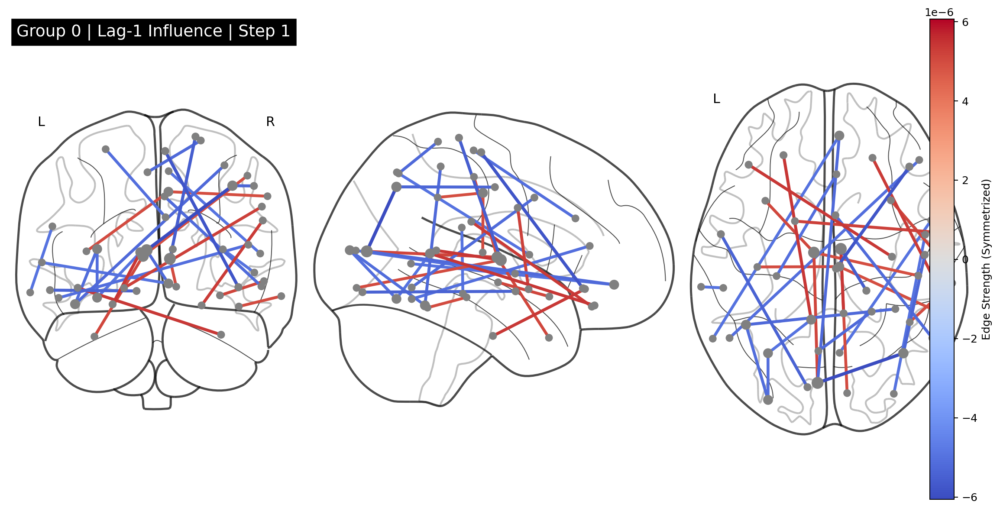

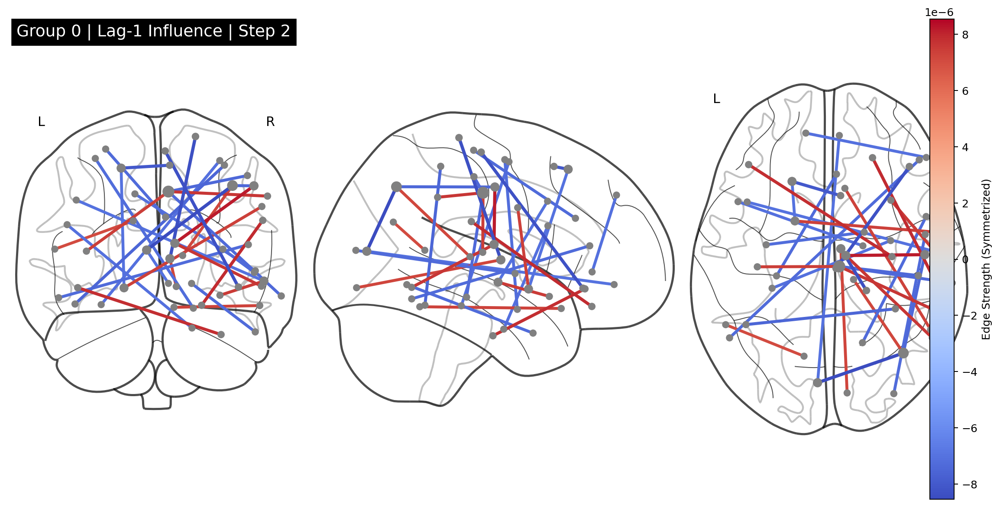

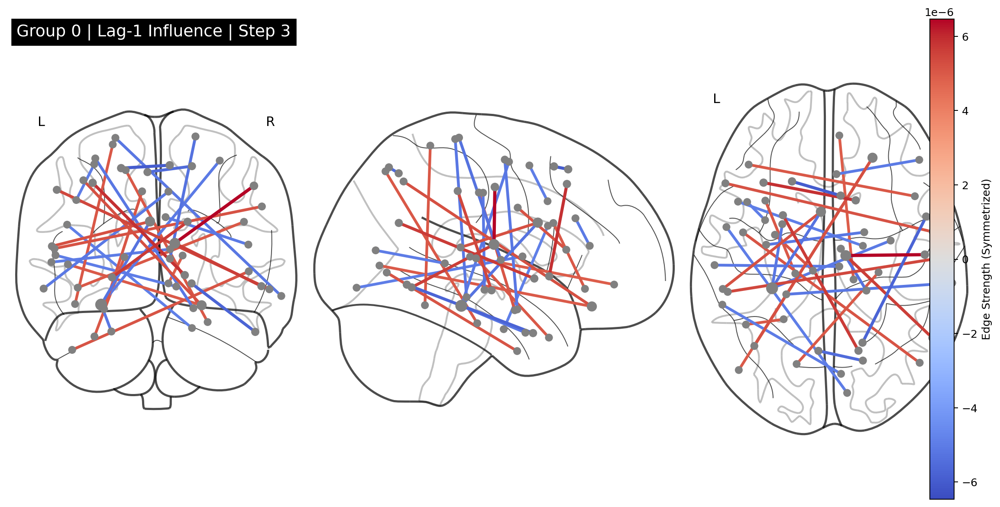

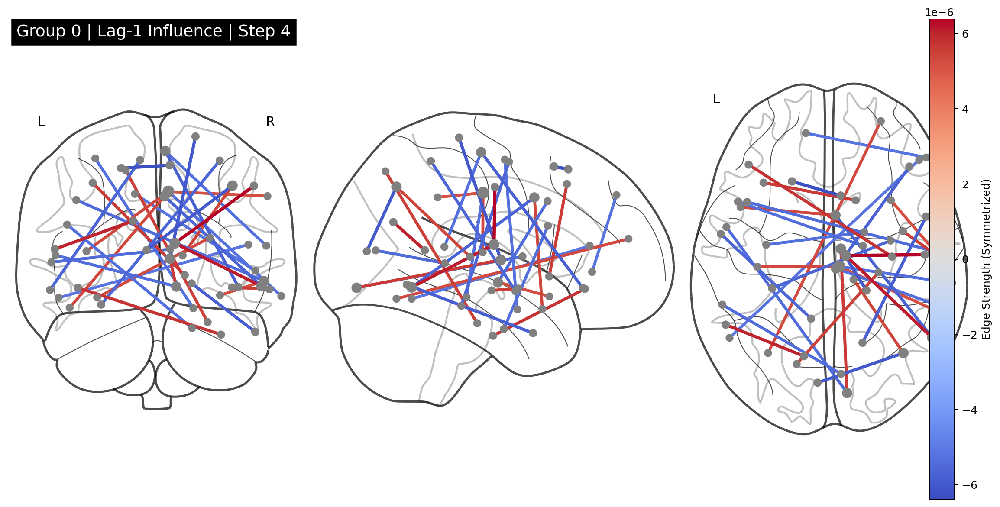

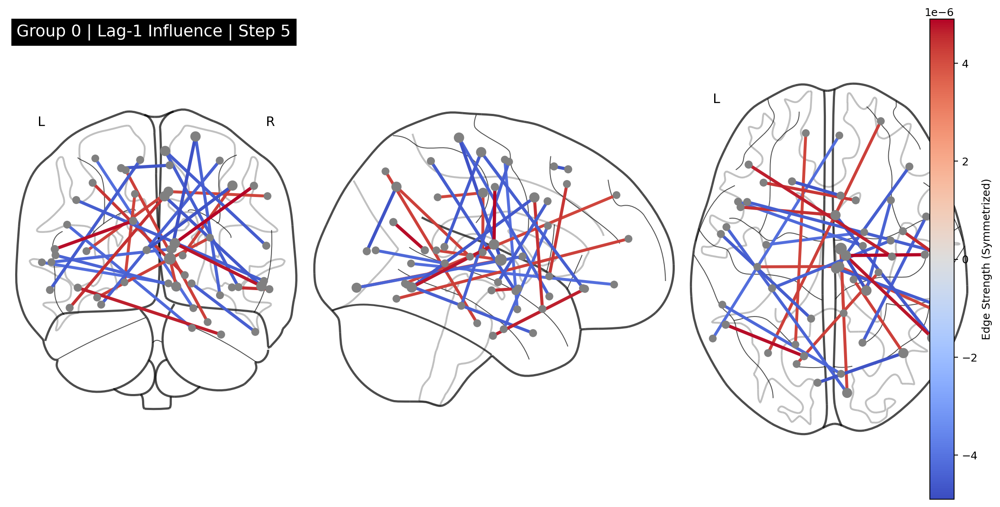

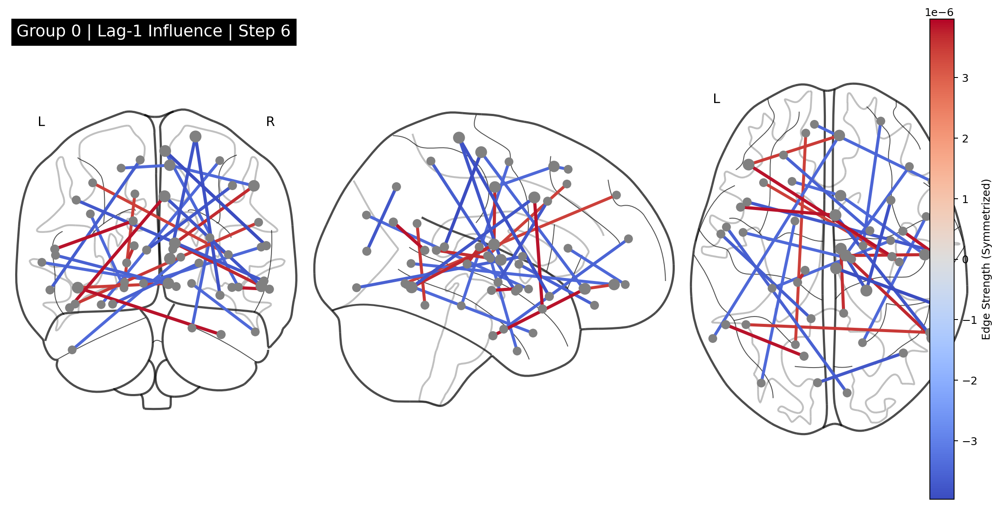

KeyboardInterrupt: 

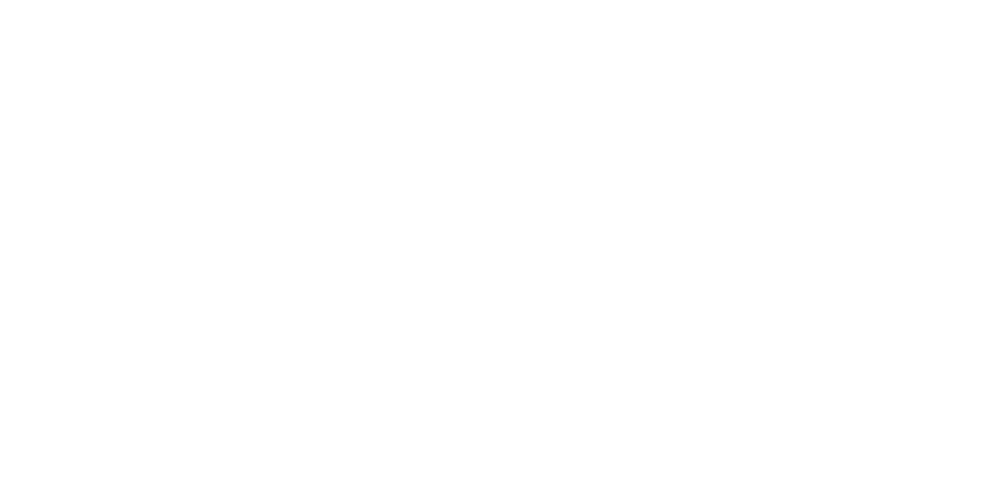

In [97]:
import pandas as pd

group_assign = {0: 0, 1: 1}

# --- 2. Run the Optimized Analysis ---
device = next(mamba.parameters()).device
atlas_path = "/kaggle/input/lemon-mri/BN_Atlas_246_2mm.nii"
label_ids, coords = bna_centroids(atlas_path) # Assumes bna_centroids is defined as in your script

# Compute per-timestep averages for up to 20 steps
group_avg_tensors = group_sequence_average(
    model=mamba,
    dataloader=train_loader,
    group_assign=group_assign,
    device=device,
    max_steps=20,
    rows="source",
    include_gate=True,
)

# Visualize connectomes for timesteps 1, 5, 10, and 20 for each group
timesteps_to_plot = [(x + 1) for x in range(20)]

for gid in sorted(group_avg_tensors.keys()):
    print(f"\n--- Visualizing connectomes for Group {gid} ---")
    visualize_group_connectome_timesteps(
        group_avg_tensors,
        gid,
        coords,
        timesteps=timesteps_to_plot,
        global_frac=1/2000,  # Keep the strongest 1% of connections
        hide_isolated=True,
        node_color="gray", 
        title_prefix=f"Group {gid} | Lag-1 Influence | Step {{t}}",
    )

In [98]:
!pip install plotly ipywidgets

In [99]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json
Paths used for configuration of notebook: 
    	
      - Validating: OK
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json


In [100]:
import numpy as np
import torch
import plotly.graph_objects as go
import ipywidgets as widgets
from IPython.display import display


In [103]:
import numpy as np
import nibabel as nib
import plotly.graph_objects as go

def animate_connectome_with_brain(group_avg_tensors, coords, group_id, atlas_path, frac=0.001):
    """
    group_avg_tensors: dict[group_id -> tensor [D,D,T]]
    coords: numpy array [D,3] (ROI centroids)
    atlas_path: path to BNA atlas NIfTI
    frac: fraction of strongest edges to display
    """
    # 1️⃣ Load atlas and get non-zero voxel coordinates for brain surface
    atlas_img = nib.load(atlas_path)
    atlas_data = atlas_img.get_fdata()
    x_brain, y_brain, z_brain = np.nonzero(atlas_data)
    x_brain = x_brain / x_brain.max()
    y_brain = y_brain / y_brain.max()
    z_brain = z_brain / z_brain.max()

    brain_surface = go.Scatter3d(
        x=x_brain, y=y_brain, z=z_brain,
        mode="markers",
        marker=dict(size=1, color="lightgray", opacity=0.1),
        name="Brain"
    )

    M_seq = group_avg_tensors[group_id]
    D, _, T = M_seq.shape

    frames = []
    for step in range(T):
        M_t = M_seq[:, :, step]
        M_abs = np.abs(M_t)
        threshold = np.percentile(M_abs[np.triu_indices_from(M_abs, 1)], 100*(1-frac))
        M_f = np.where(M_abs >= threshold, M_t, 0)

        edges_x, edges_y, edges_z = [], [], []
        for i in range(D):
            for j in range(i+1, D):
                if M_f[i,j] != 0:
                    edges_x += [coords[i,0], coords[j,0], None]
                    edges_y += [coords[i,1], coords[j,1], None]
                    edges_z += [coords[i,2], coords[j,2], None]

        frames.append(go.Frame(
            data=[
                brain_surface,
                go.Scatter3d(x=coords[:,0], y=coords[:,1], z=coords[:,2],
                             mode="markers", marker=dict(size=3, color="red")),
                go.Scatter3d(x=edges_x, y=edges_y, z=edges_z,
                             mode="lines", line=dict(width=1, color="blue"))
            ],
            name=f"Step {step+1}"
        ))

    fig = go.Figure(
        data=frames[0].data,
        layout=go.Layout(
            title=f"Group {group_id} — Step 1",
            updatemenus=[{
                "buttons":[
                    {"args":[None, {"frame":{"duration":500,"redraw":True}, "fromcurrent":True}],
                     "label":"Play","method":"animate"},
                    {"args":[[None], {"frame":{"duration":0,"redraw":False}, "mode":"immediate"}],
                     "label":"Pause","method":"animate"}
                ],
                "direction":"left","pad":{"r":10,"t":87},
                "showactive":False,"type":"buttons","x":0.1,"xanchor":"right","y":0,"yanchor":"top"
            }],
            sliders=[{
                "steps":[
                    {"args":[[f"Step {k+1}"], {"frame":{"duration":0,"redraw":True},"mode":"immediate"}],
                     "label":f"{k+1}","method":"animate"} for k in range(T)
                ],
                "x":0.1,"len":0.9
            }],
            scene=dict(
                xaxis=dict(visible=False),
                yaxis=dict(visible=False),
                zaxis=dict(visible=False),
                aspectmode="data"
            )
        ),
        frames=frames
    )

    fig.show(renderer="iframe")

In [104]:
atlas_path = "/kaggle/input/lemon-mri/BN_Atlas_246_2mm.nii"
animate_connectome_with_brain(group_avg_tensors, coords, group_id=0, atlas_path=atlas_path, frac=0.001)

In [105]:
import numpy as np
import nibabel as nib
import plotly.graph_objects as go
import plotly.io as pio

# Ensure Plotly works in Kaggle
pio.renderers.default = "notebook"  # or "iframe" if "notebook" fails

def animate_connectome_with_brain(
    group_avg_tensors,
    coords,
    group_id,
    atlas_path,
    frac=0.001
):
    """
    group_avg_tensors: dict[group_id -> tensor [D,D,T]]
    coords: numpy array [D,3] (ROI centroids, in voxel space or mm)
    atlas_path: path to BNA atlas NIfTI
    frac: fraction of strongest edges to display
    """
    # 1️⃣ Load atlas and normalize voxel coordinates
    atlas_img = nib.load(atlas_path)
    atlas_data = atlas_img.get_fdata()
    x_brain, y_brain, z_brain = np.nonzero(atlas_data)
    x_brain = x_brain / atlas_data.shape[0]
    y_brain = y_brain / atlas_data.shape[1]
    z_brain = z_brain / atlas_data.shape[2]

    # Normalize ROI coordinates to atlas dimensions
    coords_norm = np.zeros_like(coords)
    coords_norm[:,0] = coords[:,0] / atlas_data.shape[0]
    coords_norm[:,1] = coords[:,1] / atlas_data.shape[1]
    coords_norm[:,2] = coords[:,2] / atlas_data.shape[2]

    # Brain surface
    brain_surface = go.Scatter3d(
        x=x_brain, y=y_brain, z=z_brain,
        mode="markers",
        marker=dict(size=1, color="lightgray", opacity=0.1),
        name="Brain"
    )

    M_seq = group_avg_tensors[group_id]  # [D, D, T]
    D, _, T = M_seq.shape
    frames = []

    for step in range(T):
        M_t = M_seq[:, :, step]
        M_abs = np.abs(M_t)
        threshold = np.percentile(M_abs[np.triu_indices_from(M_abs, 1)], 100*(1-frac))
        M_f = np.where(M_abs >= threshold, M_t, 0)

        edges_x, edges_y, edges_z = [], [], []
        for i in range(D):
            for j in range(i+1, D):
                if M_f[i,j] != 0:
                    edges_x += [coords_norm[i,0], coords_norm[j,0], None]
                    edges_y += [coords_norm[i,1], coords_norm[j,1], None]
                    edges_z += [coords_norm[i,2], coords_norm[j,2], None]

        frames.append(go.Frame(
            data=[
                brain_surface,
                go.Scatter3d(
                    x=coords_norm[:,0],
                    y=coords_norm[:,1],
                    z=coords_norm[:,2],
                    mode="markers",
                    marker=dict(size=3, color="red"),
                    name="ROIs"
                ),
                go.Scatter3d(
                    x=edges_x,
                    y=edges_y,
                    z=edges_z,
                    mode="lines",
                    line=dict(width=1, color="blue"),
                    name="Connections"
                )
            ],
            name=f"Step {step+1}"
        ))

    fig = go.Figure(
        data=frames[0].data,
        layout=go.Layout(
            title=f"Group {group_id} — Step 1",
            updatemenus=[{
                "buttons":[
                    {"args":[None, {"frame":{"duration":500,"redraw":True}, "fromcurrent":True}],
                     "label":"Play","method":"animate"},
                    {"args":[[None], {"frame":{"duration":0,"redraw":False}, "mode":"immediate"}],
                     "label":"Pause","method":"animate"}
                ],
                "direction":"left","pad":{"r":10,"t":87},
                "showactive":False,"type":"buttons","x":0.1,"xanchor":"right","y":0,"yanchor":"top"
            }],
            sliders=[{
                "steps":[
                    {"args":[[f"Step {k+1}"], {"frame":{"duration":0,"redraw":True},"mode":"immediate"}],
                     "label":f"{k+1}","method":"animate"} for k in range(T)
                ],
                "x":0.1,"len":0.9
            }],
            scene=dict(
                xaxis=dict(visible=False),
                yaxis=dict(visible=False),
                zaxis=dict(visible=False),
                aspectmode="data"
            )
        ),
        frames=frames
    )

    fig.show(renderer="notebook")


In [ ]:
atlas_path = "/kaggle/input/lemon-mri/BN_Atlas_246_2mm.nii"

animate_connectome_with_brain(
    group_avg_tensors,
    coords,        # your ROI centroids from bna_centroids()
    group_id=0,
    atlas_path=atlas_path,
    frac=0.001     # top 0.1% edges
)
